# Rainfall Prediction 

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [2]:
df = pd.read_csv("Weather Data[226].csv")

In [3]:
pd.set_option('display.max_columns', None)
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0.0,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0.0,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,0.0,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,1.0,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0.2,No


In [4]:
df.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow
142188,2017-06-20,Uluru,3.5,21.8,0.0,NaN,NaN,E,31.0,ESE,E,15.0,13.0,59.0,27.0,1024.7,1021.2,NaN,NaN,9.4,20.9,No,0.0,No
142189,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,0.0,No
142190,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,0.0,No
142191,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,0.0,No
142192,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,0.0,No


In [5]:
print(f"The shape of the dataset is {df.shape}")

The shape of the dataset is (142193, 24)


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142193 entries, 0 to 142192
Data columns (total 24 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           142193 non-null  object 
 1   Location       142193 non-null  object 
 2   MinTemp        141556 non-null  float64
 3   MaxTemp        141871 non-null  float64
 4   Rainfall       140787 non-null  float64
 5   Evaporation    81350 non-null   float64
 6   Sunshine       74377 non-null   float64
 7   WindGustDir    132863 non-null  object 
 8   WindGustSpeed  132923 non-null  float64
 9   WindDir9am     132180 non-null  object 
 10  WindDir3pm     138415 non-null  object 
 11  WindSpeed9am   140845 non-null  float64
 12  WindSpeed3pm   139563 non-null  float64
 13  Humidity9am    140419 non-null  float64
 14  Humidity3pm    138583 non-null  float64
 15  Pressure9am    128179 non-null  float64
 16  Pressure3pm    128212 non-null  float64
 17  Cloud9am       88536 non-null

In [7]:
print(f"The columns in this dataset are: \n{df.columns}")

The columns in this dataset are: 
Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RISK_MM', 'RainTomorrow'],
      dtype='object')


In [8]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RISK_MM
count,141556.000000,141871.000000,140787.000000,81350.000000,74377.000000,132923.000000,140845.000000,139563.000000,140419.000000,138583.000000,128179.000000,128212.000000,88536.000000,85099.000000,141289.000000,139467.000000,142193.000000
mean,12.186400,23.226784,2.349974,5.469824,7.624853,39.984292,14.001988,18.637576,68.843810,51.482606,1017.653758,1015.258204,4.437189,4.503167,16.987509,21.687235,2.360682
std,6.403283,7.117618,8.465173,4.188537,3.781525,13.588801,8.893337,8.803345,19.051293,20.797772,7.105476,7.036677,2.887016,2.720633,6.492838,6.937594,8.477969
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,0.000000,0.000000,-7.200000,-5.400000,0.000000
25%,7.600000,17.900000,0.000000,2.600000,4.900000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.900000,1010.400000,1.000000,2.000000,12.300000,16.600000,0.000000
50%,12.000000,22.600000,0.000000,4.800000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.600000,1015.200000,5.000000,5.000000,16.700000,21.100000,0.000000
75%,16.800000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.400000,1020.000000,7.000000,7.000000,21.600000,26.400000,0.800000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.700000,371.000000


In [9]:
#converting Date column to Date_Time format
df['Date'] = pd.to_datetime(df['Date'])
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day
df.drop(columns=['Date'], inplace=True)

In [10]:
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow,Year,Month,Day
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0.0,No,2008,12,1
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0.0,No,2008,12,2
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,0.0,No,2008,12,3
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,1.0,No,2008,12,4
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0.2,No,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142188,Uluru,3.5,21.8,0.0,NaN,NaN,E,31.0,ESE,E,15.0,13.0,59.0,27.0,1024.7,1021.2,NaN,NaN,9.4,20.9,No,0.0,No,2017,6,20
142189,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,0.0,No,2017,6,21
142190,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,0.0,No,2017,6,22
142191,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,0.0,No,2017,6,23


In [11]:
for i in df.columns:
    print(f'The unique values in {i}, are {df[i].unique()}')
    print()

The unique values in Location, are ['Albury' 'BadgerysCreek' 'Cobar' 'CoffsHarbour' 'Moree' 'Newcastle'
 'NorahHead' 'NorfolkIsland' 'Penrith' 'Richmond' 'Sydney' 'SydneyAirport'
 'WaggaWagga' 'Williamtown' 'Wollongong' 'Canberra' 'Tuggeranong'
 'MountGinini' 'Ballarat' 'Bendigo' 'Sale' 'MelbourneAirport' 'Melbourne'
 'Mildura' 'Nhil' 'Portland' 'Watsonia' 'Dartmoor' 'Brisbane' 'Cairns'
 'GoldCoast' 'Townsville' 'Adelaide' 'MountGambier' 'Nuriootpa' 'Woomera'
 'Albany' 'Witchcliffe' 'PearceRAAF' 'PerthAirport' 'Perth' 'SalmonGums'
 'Walpole' 'Hobart' 'Launceston' 'AliceSprings' 'Darwin' 'Katherine'
 'Uluru']

The unique values in MinTemp, are [13.4  7.4 12.9  9.2 17.5 14.6 14.3  7.7  9.7 13.1 15.9 12.6  9.8 14.1
 13.5 11.2 11.5 17.1 20.5 15.3 16.2 16.9 20.1 19.7 12.5 12.  11.3  9.6
 10.5 12.3 13.7 16.1 14.  17.  17.3 17.2 17.4 19.8 14.9 13.9 18.6 19.3
 24.4 18.8 20.8 15.7 18.5 20.4 21.8 22.3 22.  28.  21.5 21.7 23.5 28.3
 18.4 12.4 13.3 18.  18.7 15.5  8.9 15.  15.4 16.  12.8 13.2 13.8

The unique values in RainToday, are ['No' 'Yes' nan]

The unique values in RISK_MM, are [0.000e+00 1.000e+00 2.000e-01 1.400e+00 2.200e+00 1.560e+01 3.600e+00
 1.680e+01 1.060e+01 1.200e+00 8.000e-01 6.000e-01 6.400e+00 4.000e-01
 3.000e+00 5.800e+00 1.160e+01 1.800e+00 8.600e+00 1.260e+01 8.400e+00
 6.200e+00 2.000e+01 2.100e+01 3.200e+00 4.800e+00 4.200e+00 8.000e+00
 1.440e+01 4.600e+00 2.000e+00 5.600e+00 1.600e+00 6.000e+00 4.400e+00
 5.400e+00 5.000e+00 7.800e+00 6.800e+00 9.800e+00 3.800e+00 2.400e+00
 5.200e+00 6.600e+00 1.340e+01 1.020e+01 2.880e+01 7.000e+00 2.580e+01
 9.400e+00 1.240e+01 5.220e+01 2.060e+01 6.600e+01 1.100e+01 1.700e+01
 1.040e+01 2.800e+01 2.140e+01 1.860e+01 7.200e+00 8.200e+00 1.080e+01
 1.540e+01 9.600e+00 4.000e+00 2.180e+01 2.080e+01 2.480e+01 1.000e+01
 1.140e+01 1.900e+01 2.220e+01 3.280e+01 3.400e+00 5.080e+01 5.260e+01
 1.920e+01 1.880e+01 1.480e+01 1.200e+01 1.840e+01 2.560e+01 3.500e+01
 1.420e+01 1.380e+01 2.600e+00 9.920e+01 5.100e+01 3.980e+01

In [12]:
df.isna().sum()

Location             0
MinTemp            637
MaxTemp            322
Rainfall          1406
Evaporation      60843
Sunshine         67816
WindGustDir       9330
WindGustSpeed     9270
WindDir9am       10013
WindDir3pm        3778
WindSpeed9am      1348
WindSpeed3pm      2630
Humidity9am       1774
Humidity3pm       3610
Pressure9am      14014
Pressure3pm      13981
Cloud9am         53657
Cloud3pm         57094
Temp9am            904
Temp3pm           2726
RainToday         1406
RISK_MM              0
RainTomorrow         0
Year                 0
Month                0
Day                  0
dtype: int64

In [13]:
# filling null values with Mode
mode = ["WindGustDir", "WindDir9am", "WindDir3pm"]
df[mode]=df[mode].fillna(df.mode().iloc[0])

#filling null values with Back fill method
back = ['Cloud9am', 'Cloud3pm', 'RainToday']
df[back]=df[back].fillna(method ='bfill')

# filling null values with Mean
df = df.fillna(df.mean())

C:\Users\lenovo\AppData\Local\Temp\ipykernel_8260\1188837318.py:10: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df = df.fillna(df.mean())


In [14]:
df.isna().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RISK_MM          0
RainTomorrow     0
Year             0
Month            0
Day              0
dtype: int64

In [15]:
#Label Encoding
col = ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']
label = LabelEncoder()
for i in col:
    df[i] = label.fit_transform(df[i])
df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow,Year,Month,Day
0,2,13.4,22.9,0.6,5.469824,7.624853,13,44.0,13,14,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,2.0,16.9,21.8,0,0.0,0,2008,12,1
1,2,7.4,25.1,0.0,5.469824,7.624853,14,44.0,6,15,4.0,22.0,44.0,25.0,1010.6,1007.8,7.0,2.0,17.2,24.3,0,0.0,0,2008,12,2
2,2,12.9,25.7,0.0,5.469824,7.624853,15,46.0,13,15,19.0,26.0,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,0,0.0,0,2008,12,3
3,2,9.2,28.0,0.0,5.469824,7.624853,4,24.0,9,0,11.0,9.0,45.0,16.0,1017.6,1012.8,7.0,8.0,18.1,26.5,0,1.0,0,2008,12,4
4,2,17.5,32.3,1.0,5.469824,7.624853,13,41.0,1,7,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0,0.2,0,2008,12,5


<AxesSubplot:>

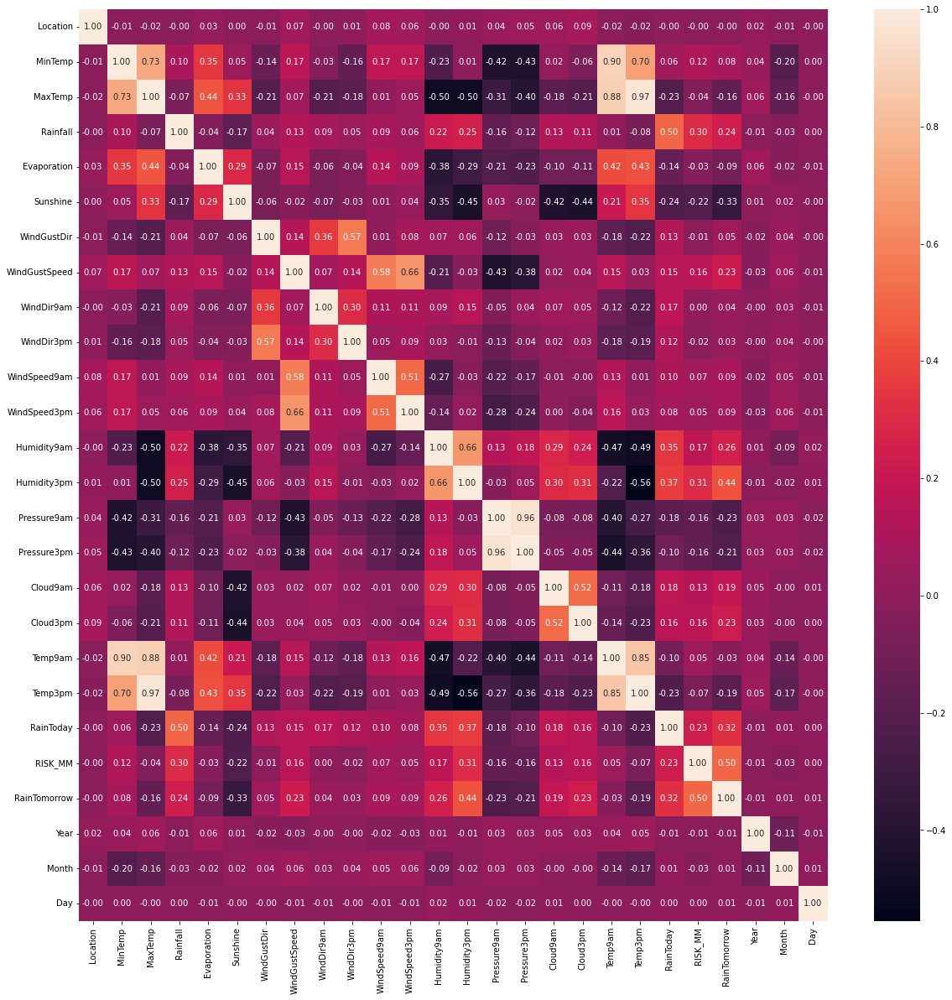

In [16]:
#Correlation Heatmap
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(), annot= True, fmt='.2f')

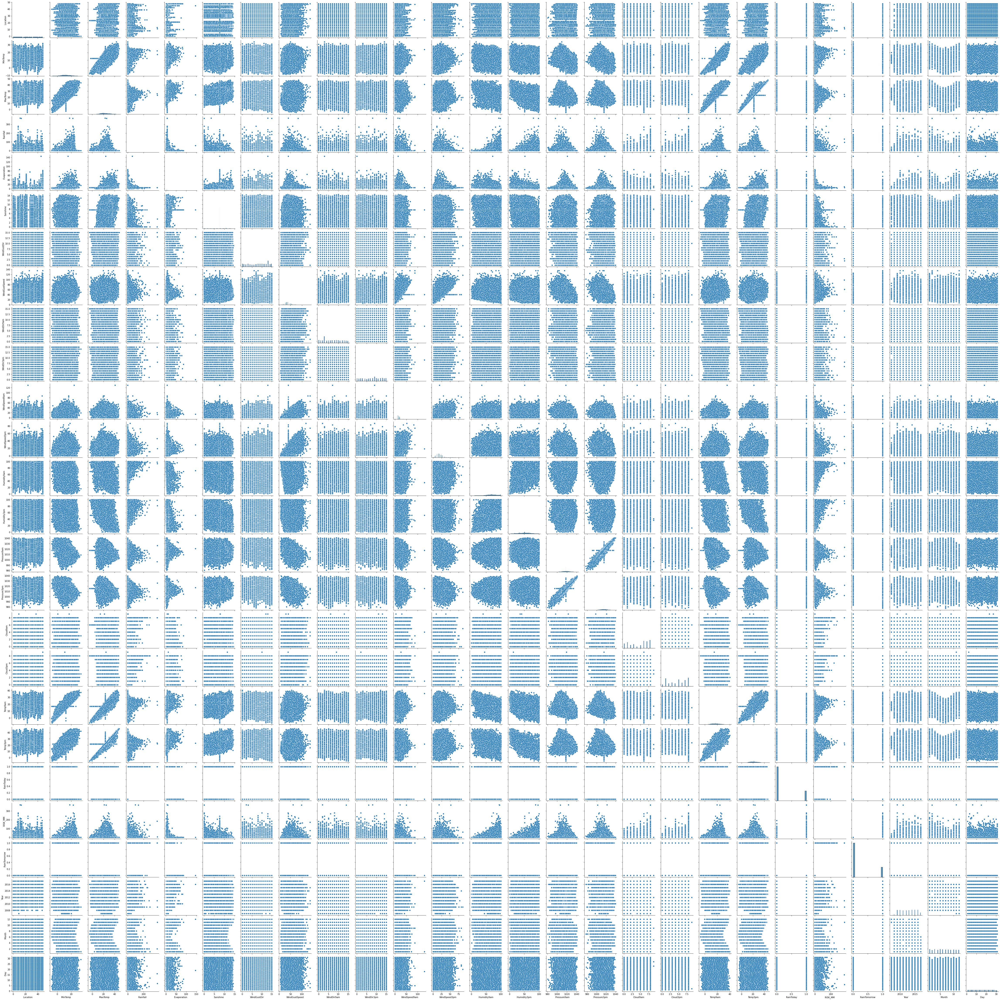

In [17]:
sns.pairplot(df)

In [16]:
#Split the set into feature and target varibles(X,y)
X = df.drop(columns = ['RainTomorrow'])
y = df['RainTomorrow']

In [17]:
print(f'The shape of X is {X.shape}')
print(f'The shape of y is {y.shape}')

The shape of X is (142193, 25)
The shape of y is (142193,)


In [18]:
#Standardizing Data
scaler = MinMaxScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns = X.columns)
X.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,Year,Month,Day
0,0.041667,0.516509,0.523629,0.001617,0.037723,0.525852,0.866667,0.294574,0.866667,0.933333,0.153846,0.275862,0.71,0.22,0.449587,0.4800,0.888889,0.222222,0.508439,0.522073,0.0,0.000000,0.1,1.0,0.000000
1,0.041667,0.375000,0.565217,0.000000,0.037723,0.525852,0.933333,0.294574,0.400000,1.000000,0.030769,0.252874,0.44,0.25,0.497521,0.4912,0.777778,0.222222,0.514768,0.570058,0.0,0.000000,0.1,1.0,0.033333
2,0.041667,0.504717,0.576560,0.000000,0.037723,0.525852,1.000000,0.310078,0.866667,1.000000,0.146154,0.298851,0.38,0.30,0.447934,0.5056,0.777778,0.222222,0.594937,0.548944,0.0,0.000000,0.1,1.0,0.066667
3,0.041667,0.417453,0.620038,0.000000,0.037723,0.525852,0.266667,0.139535,0.600000,0.000000,0.084615,0.103448,0.45,0.16,0.613223,0.5712,0.777778,0.888889,0.533755,0.612284,0.0,0.002695,0.1,1.0,0.100000
4,0.041667,0.613208,0.701323,0.002695,0.037723,0.525852,0.866667,0.271318,0.066667,0.466667,0.053846,0.229885,0.82,0.33,0.500826,0.4624,0.777778,0.888889,0.527426,0.673704,0.0,0.000539,0.1,1.0,0.133333


In [19]:
#Split the data into training and testing set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 100)

In [20]:
print(f'The shape of X_train is {X_train.shape}')
print(f'The shape of y_train is {y_train.shape}')
print(f'The shape of X_test is {X_test.shape}')
print(f'The shape of y_test is {y_test.shape}')

The shape of X_train is (99535, 25)
The shape of y_train is (99535,)
The shape of X_test is (42658, 25)
The shape of y_test is (42658,)


# Logistic Regression

C:\Users\lenovo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy Score of the model is: 0.8972760091893666
Confusion matrix is: 
 AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

           0       0.90      0.98      0.94     33017
           1       0.90      0.61      0.73      9641

    accuracy                           0.90     42658
   macro avg       0.90      0.80      0.83     42658
weighted avg       0.90      0.90      0.89     42658



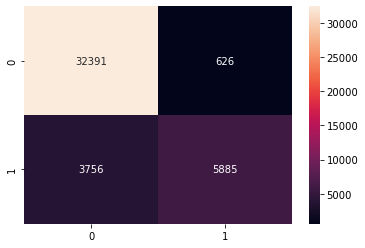

In [24]:
from sklearn.linear_model import LogisticRegression
lr_model = LogisticRegression()
lr_model.fit(X_train, y_train)
y_pred_lr = lr_model.predict(X_test)
print(f'Accuracy Score of the model is: {accuracy_score(y_test, y_pred_lr)}')
print(f"Confusion matrix is: \n {sns.heatmap(confusion_matrix(y_test,y_pred_lr), annot = True, fmt = 'd')}")
print(classification_report(y_test, y_pred_lr))

# Random Forest Classifier

In [25]:
from sklearn.ensemble import RandomForestClassifier
params = {'n_estimators':[10,20,30], 'max_depth':[2,4,6], 'n_jobs':[1,2,4], 'random_state':[1,2,3]}
gsv_rf = GridSearchCV(RandomForestClassifier(), params, scoring= 'accuracy')
gsv_rf.fit(X, y)

print(f'The best estimator is {gsv_rf.best_estimator_}')
print(f'The best parameters are {gsv_rf.best_params_}')
print(f'The best score is {gsv_rf.best_score_}')

The best estimator is RandomForestClassifier(max_depth=2, n_estimators=10, n_jobs=1, random_state=1)
The best parameters are {'max_depth': 2, 'n_estimators': 10, 'n_jobs': 1, 'random_state': 1}
The best score is 1.0


Accuracy Score of the model is: 1.0
Confusion matrix is: 
 AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     33017
           1       1.00      1.00      1.00      9641

    accuracy                           1.00     42658
   macro avg       1.00      1.00      1.00     42658
weighted avg       1.00      1.00      1.00     42658



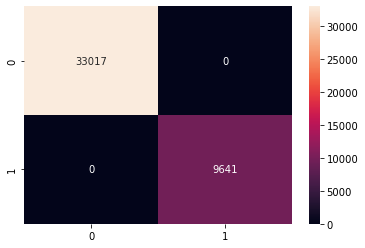

In [26]:
rf_model = RandomForestClassifier(max_depth = 2, n_estimators = 10, n_jobs = 1, random_state = 1)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)


print(f'Accuracy Score of the model is: {accuracy_score(y_test, y_pred_rf)}')
print(f"Confusion matrix is: \n {sns.heatmap(confusion_matrix(y_test,y_pred_rf), annot = True, fmt = 'd')}")
print(classification_report(y_test, y_pred_rf))

# SVC

Accuracy Score of the model is: 0.899362370481504
Confusion matrix is: 
 AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

           0       0.89      0.99      0.94     33017
           1       0.95      0.59      0.73      9641

    accuracy                           0.90     42658
   macro avg       0.92      0.79      0.83     42658
weighted avg       0.90      0.90      0.89     42658



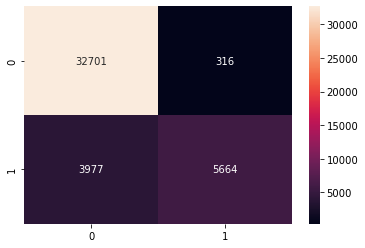

In [22]:
from sklearn.svm import SVC
svc_model = SVC()
svc_model.fit(X_train, y_train)
y_pred_svc = svc_model.predict(X_test)

print(f'Accuracy Score of the model is: {accuracy_score(y_test, y_pred_svc)}')
print(f"Confusion matrix is: \n {sns.heatmap(confusion_matrix(y_test,y_pred_svc), annot = True, fmt = 'd')}")
print(classification_report(y_test, y_pred_svc))

# AdaBoost Classifier

Accuracy Score of the model is: 1.0
Confusion matrix is: 
 AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     33017
           1       1.00      1.00      1.00      9641

    accuracy                           1.00     42658
   macro avg       1.00      1.00      1.00     42658
weighted avg       1.00      1.00      1.00     42658



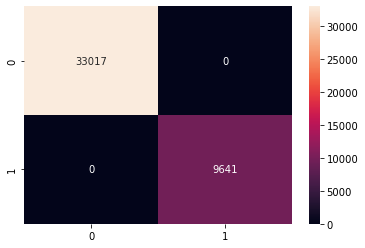

In [23]:
from sklearn.ensemble import AdaBoostClassifier
ada_model = AdaBoostClassifier()
ada_model.fit(X_train, y_train)
y_pred_ada = ada_model.predict(X_test)

print(f'Accuracy Score of the model is: {accuracy_score(y_test, y_pred_ada)}')
print(f"Confusion matrix is: \n {sns.heatmap(confusion_matrix(y_test,y_pred_ada), annot = True, fmt = 'd')}")
print(classification_report(y_test, y_pred_ada))

In [41]:
data = {'Model':['Logistic Regression', 'Random Forest Classifier', 'Support Vector Machine', 'AdaBoost Classifier'], 'Accuracy Scores':[accuracy_score(y_test, y_pred_lr), accuracy_score(y_test, y_pred_rf), accuracy_score(y_test, y_pred_svc), accuracy_score(y_test, y_pred_ada)]}
submit = pd.DataFrame(data)
submit

,Model,Accuracy Scores
0,Logistic Regression,0.897276
1,Random Forest Classifier,1.000000
2,Support Vector Machine,0.899362
3,AdaBoost Classifier,1.000000
